# Hubmap + HPA Hacking the Human Body - Training Notebook

## Objective:

Hubmap + HPA Hacking the Human Body was a competition launched to segregate or segment FTU (Functional Tissue Units) among cells. 

In the average kidney, there are over 1 million glomeruli FTUs. While there are existing cell and FTU segmentation methods, the objective of the competition to push the boundaries by building algorithms that generalize across different organs and are robust across different dataset differences.

## Problem Statement: 

- We are provided with a dataset consisting of tiff format train and test images , annotation files in json format. And other details like RLE (Run length encoding) in a csv. 
- Our aim is to put all together and build a model that could segment and bring out FTUs leaving out other organs.
- The competition also has some hidden dataset which will also be added upon in evaluation.

Size after split of data: Train= 280 Images, Valid = 42 Images, Test = 29 Images

## BEST SUBMISSION 

MODEL : SegFormer b4 finetuned ADE 512-512

Submissions Scores:

    - PRIVATE : 0.68734, 
    
    - PUBLIC: 0.68266,
    
    RANK: 410.

## List of Experiments

### Segmentation models in pytorch

#### Experiments with models :

| Decoder |  Encoder  | Train  | Valid | Test    |  Private |  Public  |
| ----- |  -----  | -----  | ----    | ----    |  ------- |  ------  |
| Constant Decoder | Change Encoders |   |  |   |  |  |
| Unet |  MobileNet V2  | 0.721  | 0.54 |  0.55  |  0.47132 | 0.53429  | 
|  | Timm-Res2next50 |  0.658  | 0.566  |  0.587  |  0.53091 | 0.5748  |
|  | VGG19_bn | 0.856  | 0.489  |  0.553  |  0.55638 | 0.62092  |
|  | Efficient Net b4 |  0.774  | 0.451  | 0.476  | 0.43136  | 0.44308 |
| |  |    |  |   |  |  |
| DEEPLABSV3++ | Mobilenet V2 |  0.654  | 0.492  |  0.560  | 0.35335  | 0.42664  |
|  | Efficientnet-b7 |  0.694  | 0.534  |  0.630  | 0.33126  | 0.42143  |
| |  |    |  |   |  |  |
| Change Decoder | Constant Encoders |   |  |   |  |  |
| Unet | VGG19_bn |  0.843  | 0.466  |  0.510  | 0.54539  | 0.61645  |
| Linknet |  |  0.871  | 0.427  |  0.465  | 0.5477  | 0.61182  |
| UnetPlusPlus |  |  0.930  | 0.700  |  0.687  | 0.48033  | 0.54471  |
| |  |    |  |   |  |  |


Best Combo: UNet, Vgg-19bn

#### Experiment with Hyperparameters (LR_Schedulers, Optimizers, Activation functions)

| Parameter tuned | Trial | Train  | Valid | Test    |  Private |  Public  |
| ----- | ----- |  -----  | ----  | ----    |  ------- |  ------  |
| LR_Scheduler | StepLR |  0.639  | 0.583  |  0.594  |  0.49772 | 0.49372  | 
| | LambdaLR |  0.953  | 0.696  |  0.702  | 0.49806  | 0.55773  | 
| | Multistep LR |  0.871  | 0.696  |  0.696  |  0.47839 |  0.53487 |
| | CosineAnnealingLR |  0.827  | 0.678  |  0.707  |  0.49847 |  0.54805 |
| | CosineWarmingRestartLR |  0.908  | 0.708  |  0.701  | 0.49187  |  0.54951 |
| | ExponentialLR |  0.639  | 0.583  |  0.594  |  0.49772 | 0.49372  |
| | LinearLR |  0.812  |  0.666 |  0.621  |  0.44134 |  0.51087 |
|  |  | |  |     |   |    |
| Optimizer | Adam | 0.856  | 0.489  |  0.553  |  0.55638 | 0.62092  |
| | AdamW |  0.854  | 0.651  |  0.685  |  0.48983 |  0.55120 | 
| | SGD |  0.951  | 0.685  |  0.666  |  0.46213 |  0.52275 |
|  |  | |  |     |   |    |
| Activation Fns | Tanh |  0.839  | 0.689  |  0.704  |  0.40839 |  0.35819 |
| | Sigmoid |  0.886  | 0.707  |  0.732  |  0.48568 |  0.55205 |  
| |  Identity | 0.856  | 0.489  |  0.553  |  0.55638 | 0.62092  |

Best Combo: Cosine Annealing LR, AdamW, Identity

#### Experiment with Loss Functions

| Loss Functions | Train  | Valid | Test    |  Private |  Public  |
| ----- |  -----  | ----  | ----    |  ------- |  ------  |
| BCE + lovasz_tversky_loss |  0.866  |  0.618 |  0.662  |  0.50363 |  0.55394 |
|  Focal + tversky_loss |  0.756  |  0.681 |  0.658  |  0.50496 |  0.56365 |
| BCE + Dice loss(For reference) |  0.856  |  0.489 |  0.553  |  0.55638 |  0.62092 |

Best Combo: BCE + Dice Loss

## Transformer Models

Initially experimented with different available models to fix upon the best performing one. This was done with less epochs(20-30) to facilitate trying out multiple models.

| Model |  Train  | Valid  | Test    |  Private |  Public  |
| ----- |  -----  | -----  | ----    |  ------- |  ------  |
| Mit_b5 |  0.814  | 0.719  |  0.706  |  0.55637 | 0.62621  | 
| Upernet-tiny |  0.826  | 0.696  |  0.667  |  0.45721 | 0.51646  |
| Upernet-small |  0.918  | 0.703  |  0.688  |  0.44187 | 0.49867  |
| Upernet - Large |  0.914  | 0.738  |  0.724  | 0.51249  | 0.55138  |
| Coat_lite_medium |  0.836  | 0.715  |  0.710  |  0.52425 |  0.61180  |
| Mask 2 Former-Swin_Large |  0.834  | 0.611  |  0.597  |  0.48598 | 0.55313  | 
| Mask 2 Former-Swin_Small |  0.862  | 0.692  |  0.72   |  0.52873 | 0.59574  |
| Segformer_semantic_segmentation |  0.878  |  0.719 | 0.696   | 0.60249  |  0.64491 |
| Segformer-b0-finetuned-ade-512-512 |  0.698  | 0.593  |  0.559  |  0.45025 |  0.43684 |
| Segformer-b4-finetuned-ade-512-512 |  0.826  |  0.729 |  0.699  |  0.63944 |  0.66985 |
| Segformer-b5-finetuned-ade-640-640 |  0.884  | 0.739  |  0.737  | 0.62117  |  0.67957 | 

Then went on with tuning of the tunable hyperparameters like optimizers, schedulers etc upon choosing some of the best performing models of the above experiments.

### Hyperparameters

Model = SegFormer b4 ADE finetuned 512-512

| Parameter tuned | Trial |  Train  | Valid  | Test    |  Private |  Public  |
| ----- | ----- |  -----  | -----  | ----    |  ------- |  ------  |
| Optimizers| Adam |  0.826  |  0.729 |  0.699  |  0.63944 |  0.66985 | 
|           | AdamW |  0.850  | 0.737  |  0.694  |  0.64349 |  0.68579 | 
|           | SGD |  0.743  | 0.706  |  0.685  |  0.62650 | 0.65561  | 
| LR_Schedulers | OnecycleLR |  0.396  | 0.523  |  0.468  | 0.50548  |  0.50869 | 
|               | CosineAnnealingLR |  0.871  | 0.736  |  0.688  | 0.66708  |  0.70351 | 

Here AdamW with Cosine Annealing LR scheduler combination yielded the best results. So continued with this combo of Segformer B4 with AdamW optimizer, CosineAnnealingLR learning rate scheduler for the upcoming experiments.

Best Combo

### Loss Functions 

| Trial |  Train  | Valid  | Test    |  Private |  Public  |
| ----- |  -----  | -----  | ----    |  ------- |  ------  |
| BCE + Lovasz Loss |  0.342  | 0.628  |  0.626  | 0.59852  |  0.60745 | 
| BCE + Dice Loss |  0.850  | 0.737  |  0.694  |  0.64349 |  0.68579 | 
| Jaccard + BCE + Focal + Tversky |  0.871  | 0.741  |  0.715  |  0.67329 | 0.70811  |

### Improvement Techniques 

Tried some methods to improve the performance of model such as Stochastic Weighted Averaging LR Scheduler, Grad scalar, Stain normalization etc. of which grad scaling proved better off in my submissions.

| Trial |  Train  | Valid  | Test    |  Private |  Public  |
| ----- |  -----  | -----  | ----    |  ------- |  ------  |
| SWA LR scheduler |  0.858  | 0.726  |  0.718  |  0.63196 |  0.67205 |  
| Grad scaling |  0.959  | 0.768  |  0.775  |  0.68734 | 0.68266  | 
| Stain Normalization(Vahadane) |    |   |    |  0.41738 | 0.38317  |
| Reinhard Color Normalization |    |   |    |  0.38543 | 0.36588  |

### Organ wise Training and prediction

This was a strategy used to identify the models inability to pick the FTUs in specific organ cause of bad detection of FTUs. 
Local CVs of organ wise training are as below:

| Organ |  Train  |  Test    |  Private |  Public  |
| ----- |  -----  |  ----    |   -----  |  ----    |
| Lung |  0.903  | 0.215  |     |      |
| Spleen |  0.922  | 0.745  |     |     |
| Prostate |  0.953  | 0.808  |     |      |
| Largeintestine |  0.964  | 0.877  |    |     |
| Kidney |  0.953  | 0.942  |     |      |
| Submission |    |   |  0.64869   |   0.6986   | 

Upon submissions it was understood that lung was the badly detected organ of all. Hence measures can be taken to give the model more information on lung to identify and segment it correctly.

### Augmentations

Made trials on these augmentations along with stratified Kfolds.
- Flips
- Huesaturation Value
- CLAHE
- Random brightness contrast

### Stratified K Fold Strategy

Model : Encoder = CoAT lite medium, Decoder = daformer conv 3x3
Image_size = 1024

| Fold | Train | Valid  |  Private |  Public  |
| ----- |  -----  | -----  |  ------- |  ------  |
| 0 |  0.899 | 0.780 | 0.54809 | 0.57976 |  
| 1 |  0.954 | 0.762 | 0.50194  | 0.51826  | 
| 2 |  0.971 | 0.743 | 0.57819 | 0.61537 | 
| 3 |  0.852 | 0.756 | 0.56477 | 0.58261 |
| 4 |  0.919 | 0.756 | 0.54118  | 0.57640  |
| |  Submission  | Ensemble of 5 folds  | 0.61851  | 0.65404  |


Model : Encoder = CoAT lite medium, Decoder = daformer conv 3x3
Image_size = 768

| Fold |  Train  | Valid  |  Private |  Public  |
| ----- |  -----  | -----  |  ------- |  ------  |
| 0 |  0.793  | 0.734  | 0.50676 |  0.56170 |  
| 1 |  0.819  | 0.648  | 0.55565  | 0.59312  | 
| 2 |  0.816  | 0.631  | 0.56824 | 0.59278 | 
| 3 |  0.796  | 0.696  | 0.54905 | 0.69923 | 
| |  Submission  | Ensemble of 4 folds  | 0.60639  | 0.64493  |

Model : SegFormer b4-ADE 512x512,
 Image_size = 768

| Fold |  Train  | Valid  |  Private |  Public  |
| ----- |  -----  | -----  |  ------- |  ------  |
| 0 |  0.814  | 0.766  | 0.57768 | 0.59394  |  
| 1 |  0.827  | 0.747  | 0.58218  |  0.61007 | 
| 2 |  0.784  | 0.752  | 0.68958 | 0.67833 | 
| |  Submission  | Ensemble of 3 folds  | 0.66319  | 0.67214  |

# CODE:

In [1]:
import os
import re
import sys
import cv2
import timm
import torch
import numpy as np 
import pandas as pd
from tqdm import tqdm
import torch.nn as nn
from torch import tensor
import torch.nn.functional as F

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import torchvision
import albumentations as A
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader
from albumentations.pytorch import ToTensorV2
from timm.loss import LabelSmoothingCrossEntropy
from torch.utils.data import Dataset as BaseDataset
from sklearn.model_selection import train_test_split
from transformers import SegformerForSemanticSegmentation


In [3]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
sys.path.append("../input/pretrained-models-pytorch")
sys.path.append("../input/efficientnet-pytorch")
sys.path.append("/kaggle/input/smp-models/segmentation_models.pytorch-master")

import segmentation_models_pytorch as smp

In [7]:
def set_seed(seed=2):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True
set_seed(99)

In [8]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [9]:
train = pd.read_csv('/kaggle/input/hubmap-organ-segmentation/train.csv')

In [10]:
train_path = '/kaggle/input/hubmap-organ-segmentation/train_images'
test_path = '/kaggle/input/hubmap-organ-segmentation/test_images'

In [11]:
train.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


In [12]:
train_csv, other = train_test_split(train, test_size = 0.2, stratify = train['organ'], random_state = 42)
valid_csv, test_csv = train_test_split(other, test_size = 0.3, stratify = other['organ'], random_state = 42)

In [13]:
def rle2mask(rle, size):
    rle = np.array(list(map(int, rle.split())))
    label = np.zeros((size*size), dtype=np.uint8)
    for start, end in zip(rle[::2], rle[1::2]):
        label[start:start+end] = 1
    return label.reshape(size, size).T

def rle2mask1(mask_rle, shape=(1600,256)):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def mask2rle(mask):
    pixels = mask.T.flatten()   
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0]
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

str1 = train.iloc[0].rle
size = train.iloc[0].img_width
str2 = mask2rle(rle2mask(str1, size))
print(str1 == str2)

True


# Dataset Class

In [16]:
class ImageLoader(BaseDataset):
    def __init__(self,df, img_path, transform, return_class=False):
        self.df = df
        self.img_path = img_path
        self.transform = transform
        self.return_class = return_class

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        
        im = f"{self.img_path}/{self.df['id'].iloc[idx]}.tiff"
        img = cv2.imread(str(im))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        data_transform = A.Compose([A.Resize(1024, 1024, interpolation=cv2.INTER_NEAREST), ToTensorV2(transpose_mask=True)])
        mask = rle2mask(rle=self.df['rle'].iloc[idx], size=self.df['img_width'].iloc[idx])
        mask = np.expand_dims(mask, axis=2)
        augment = data_transform(image=img, mask=mask)
        image, mask = augment['image'], augment['mask']
        
        return image, mask

In [17]:
train_dataset = ImageLoader(train_csv, train_path, 'train')
test_dataset = ImageLoader(test_csv, train_path, 'train')
val_dataset = ImageLoader(valid_csv, train_path, 'train')

In [18]:
len(train_dataset), len(val_dataset), len(test_dataset)

(280, 49, 22)

**Dataloader**

In [19]:
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2)

In [20]:
for i in train_loader:
    print(i)
    break

[tensor([[[[245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 244],

          ...,

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 243, 245,  ..., 245, 245, 245]],



         [[245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          ...,

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 245, 245, 245]],



         [[245, 245, 245,  ..., 245, 244, 245],

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 245,  ..., 244, 245, 242],

          ...,

          [245, 245, 245,  ..., 245, 245, 245],

          [245, 245, 244,  ..., 245, 245, 245],

          [245, 242, 245,  ..., 245, 245, 245]]]], dtype=torch.uint8), tensor([[[[0, 0, 0,  ..., 0, 0, 0],

    

### Model Creation

In [25]:
class HubmapModel(nn.Module):
    def __init__(self):
        super(HubmapModel, self).__init__()
        self.model = SegformerForSemanticSegmentation.from_pretrained('nvidia/segformer-b4-finetuned-ade-512-512', num_labels=1, ignore_mismatched_sizes=True)

    def forward(self, image):
        img_segs = self.model(image)
        return img_segs.logits

In [26]:
model = HubmapModel()
model.to("cuda")

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b4-finetuned-ade-512-512 and are newly initialized because the shapes did not match:

- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([1, 768, 1, 1]) in the model instantiated

- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([1]) in the model instantiated

You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


HubmapModel(
  (model): SegformerForSemanticSegmentation(
    (segformer): SegformerModel(
      (encoder): SegformerEncoder(
        (patch_embeddings): ModuleList(
          (0): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
            (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          )
          (1): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          )
          (2): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
          )
          (3): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_

In [35]:
class CustomLoss(nn.Module):
    def __init__(self):
        super(CustomLoss,self).__init__()
        self.diceloss = smp.losses.DiceLoss(mode='binary')
        self.binloss = smp.losses.SoftBCEWithLogitsLoss(reduction = 'mean' , smooth_factor = 0.1)

    def forward(self, outputs, mask):
        dice = self.diceloss(outputs,mask)
        bce = self.binloss(outputs , mask)
        loss = dice * 0.7 + bce * 0.3
        return loss
    
class DiceCoef(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super().__init__()

    def forward(self, y_pred, y_true, smooth=1.):
        y_true = y_true.view(-1)
        y_pred = y_pred.view(-1)
        
        #Round off y_pred
        y_pred = torch.round((y_pred - y_pred.min()) / (y_pred.max() - y_pred.min()))

        intersection = (y_true * y_pred).sum()
        dice = (2.0*intersection + smooth)/(y_true.sum() + y_pred.sum() + smooth)
        
        return dice

In [37]:
epoch = 100
dice_coe = DiceCoef()
loss_func = CustomLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max = epoch)

### Train Test Loops

In [39]:
# Train and test with gradscalar

def train(num_epoch, model):
    scaler = torch.cuda.amp.GradScaler()
    itr = 0
    low_loss=999
    best_score = 0
    for epoch in tqdm(range(num_epoch)):
        losses = 0
        total = 1
        score = 0
        model.train()
        for data in train_loader:
            images, mask = data
            optimizer.zero_grad()
            images = images.float().to(device)
            mask = mask.float().to(device)
            outputs = model(images)
            loss = loss_func(outputs, mask)
            losses += loss.item()
            loss_in_batch = losses/total
            score += dice_coe(outputs,mask).item()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            loss.backward()
            optimizer.step()
            if itr % 100 == 0:
                print(f"Iteration #{itr} loss: {loss_in_batch}")
            itr += 1
            total+=1
        train_loss = losses/len(train_loader)
        score = score/len(train_loader)
        if lr_scheduler is not None:
            lr_scheduler.step()
        print(f'''Epoch {epoch+1}: Train loss    : {train_loss}, Train Dice : {score}''')
        if train_loss < low_loss:
            low_loss = train_loss
            torch.save(model.state_dict(),'lesslossmodel.pt')
            print(f'Lessloss model saved at {epoch}')
        evaluation(model)
        test_score = test(model)
        if best_score < test_score:
            best_score = test_score
            torch.save(model.state_dict(),f'Highdicemodel.pt')
            print(f'Highscore model saved at {epoch}')
        print('-'*110)
        if (epoch % 5 == 0):
            torch.save(model.state_dict(),f'Epoch{epoch+1}model.pt')

In [41]:
def evaluation(model):
    model.eval()
    valid_score = 0
    valid_loss = 0
    with torch.inference_mode():
        for img, mask in val_loader:
            img = img.float().to(device)
            mask = mask.float().to(device)
            outputs = model(img)
            loss = loss_func(outputs, mask)
            valid_loss += loss.item()
            valid_score += dice_coe(outputs,mask).item()
        valid_loss /= len(val_loader)
        valid_score /= len(val_loader)
        print(f"         Valid_loss: {valid_loss} , Valid Dice COE : {valid_score}")

In [42]:
def test(model):
    model.eval()
    test_loss = 0
    test_score = 0
    with torch.inference_mode():
        for img, mask in test_loader:
            img = img.float().to(device)
            mask = mask.float().to(device)
            outputs = model(img)
            loss = loss_func(outputs, mask)
            test_loss += loss.item()
            test_score += dice_coe(outputs,mask).item()
        test_loss /= len(test_loader)
        test_score /= len(test_loader)
        print(f"         Test_loss: {test_loss} , Test Dice COE : {test_score}")
    return test_score

In [43]:
%%time
torch.manual_seed(42) 
torch.cuda.manual_seed(42)
train(epoch,model) 

  0%|          | 0/100 [00:00<?, ?it/s]

Iteration #0 loss: 0.7994369864463806

Iteration #100 loss: 0.7324791695221816

Iteration #200 loss: 0.6635965997010321

Epoch 1: Train loss    : 0.6177505156823567, Train Dice : 0.4754921491215425

Lessloss model saved at 0

         Valid_loss: 0.4345903794984428 , Valid Dice COE : 0.7187299865166894

         Test_loss: 0.44323948973959143 , Test Dice COE : 0.6979348500343886

Highscore model saved at 0

--------------------------------------------------------------------------------------------------------------


  1%|          | 1/100 [05:43<9:27:23, 343.87s/it]

Iteration #300 loss: 0.4476637982186817

Iteration #400 loss: 0.46558359142177363

Iteration #500 loss: 0.4506187854983688

Epoch 2: Train loss    : 0.43783082701265813, Train Dice : 0.6896537588622388

Lessloss model saved at 1

         Valid_loss: 0.3909463733434677 , Valid Dice COE : 0.7369365361804256

         Test_loss: 0.40646959299390967 , Test Dice COE : 0.7148228771984577


  2%|▏         | 2/100 [11:21<9:15:35, 340.16s/it]

Highscore model saved at 1

--------------------------------------------------------------------------------------------------------------

Iteration #600 loss: 0.4093811188529177

Iteration #700 loss: 0.39994352569816805

Iteration #800 loss: 0.3962667805154294

Epoch 3: Train loss    : 0.3910027776977846, Train Dice : 0.7477789926154271

Lessloss model saved at 2

         Valid_loss: 0.4014828941043542 , Valid Dice COE : 0.7426636084327936

         Test_loss: 0.4000617577271028 , Test Dice COE : 0.7294646338983015


  3%|▎         | 3/100 [16:59<9:08:40, 339.39s/it]

Highscore model saved at 2

--------------------------------------------------------------------------------------------------------------

Iteration #900 loss: 0.39367191542367463

Iteration #1000 loss: 0.37303091150633294

Iteration #1100 loss: 0.37103216789691384

Epoch 4: Train loss    : 0.3707456415253026, Train Dice : 0.7789568712716572

Lessloss model saved at 3

         Valid_loss: 0.3825400812285287 , Valid Dice COE : 0.7534221028035972

         Test_loss: 0.391913848167116 , Test Dice COE : 0.7374606071548029


  4%|▍         | 4/100 [22:38<9:02:32, 339.09s/it]

Highscore model saved at 3

--------------------------------------------------------------------------------------------------------------

Iteration #1200 loss: 0.3728963429177249

Iteration #1300 loss: 0.364723221867124

Epoch 5: Train loss    : 0.36657713603760517, Train Dice : 0.7847951193512926

Lessloss model saved at 4

         Valid_loss: 0.4276111256711337 , Valid Dice COE : 0.7077953031644307

         Test_loss: 0.41085350242528046 , Test Dice COE : 0.7404611661690566


  5%|▌         | 5/100 [28:17<8:56:40, 338.95s/it]

Highscore model saved at 4

--------------------------------------------------------------------------------------------------------------

Iteration #1400 loss: 0.26338568329811096

Iteration #1500 loss: 0.3565487036905666

Iteration #1600 loss: 0.35000536372115953

Epoch 6: Train loss    : 0.34501373475151403, Train Dice : 0.8125556082473849

Lessloss model saved at 5

         Valid_loss: 0.403044124038852 , Valid Dice COE : 0.729636196397056

         Test_loss: 0.42086628350344574 , Test Dice COE : 0.7051334885711019

--------------------------------------------------------------------------------------------------------------


  6%|▌         | 6/100 [33:55<8:50:32, 338.65s/it]

Iteration #1700 loss: 0.36225108589444843

Iteration #1800 loss: 0.35507922502588635

Iteration #1900 loss: 0.3484585547474175

Epoch 7: Train loss    : 0.3390186945242541, Train Dice : 0.8231283063530652

Lessloss model saved at 6

         Valid_loss: 0.3931766982589449 , Valid Dice COE : 0.74836994554522


  7%|▋         | 7/100 [39:33<8:44:28, 338.37s/it]

         Test_loss: 0.41499028422615747 , Test Dice COE : 0.7136002790860154

--------------------------------------------------------------------------------------------------------------

Iteration #2000 loss: 0.3429960670267663

Iteration #2100 loss: 0.3286453602795905

Iteration #2200 loss: 0.3191530733558647

Epoch 8: Train loss    : 0.31594738454691, Train Dice : 0.8499159753905198

Lessloss model saved at 7

         Valid_loss: 0.3931854084438207 , Valid Dice COE : 0.7401609692302112


  8%|▊         | 8/100 [45:09<8:38:01, 337.84s/it]

         Test_loss: 0.403326579792933 , Test Dice COE : 0.7368661950935017

--------------------------------------------------------------------------------------------------------------

Iteration #2300 loss: 0.315929469759347

Iteration #2400 loss: 0.31196357892907184

Iteration #2500 loss: 0.305289658778472

Epoch 9: Train loss    : 0.303189940271633, Train Dice : 0.8631871316576507

Lessloss model saved at 8

         Valid_loss: 0.3949095044209033 , Valid Dice COE : 0.753305938622287

         Test_loss: 0.4064155193892392 , Test Dice COE : 0.7427213909951124


  9%|▉         | 9/100 [50:48<8:32:50, 338.14s/it]

Highscore model saved at 8

--------------------------------------------------------------------------------------------------------------

Iteration #2600 loss: 0.3106801395798907

Iteration #2700 loss: 0.3038898172958121

Epoch 10: Train loss    : 0.30714615008660723, Train Dice : 0.8547129389973763

         Valid_loss: 0.37656603814387807 , Valid Dice COE : 0.7654926248502975

         Test_loss: 0.3909640474752946 , Test Dice COE : 0.7440710291266441


 10%|█         | 10/100 [56:28<8:27:48, 338.54s/it]

Highscore model saved at 9

--------------------------------------------------------------------------------------------------------------

Iteration #2800 loss: 0.2362634241580963

Iteration #2900 loss: 0.312508228391704

Iteration #3000 loss: 0.30532607873577383

Epoch 11: Train loss    : 0.29727459491363595, Train Dice : 0.8701445312341353

Lessloss model saved at 10

         Valid_loss: 0.3904658902664574 , Valid Dice COE : 0.7557489880341657

         Test_loss: 0.40978947417302564 , Test Dice COE : 0.7302833511070772

--------------------------------------------------------------------------------------------------------------


 11%|█         | 11/100 [1:02:06<8:22:07, 338.52s/it]

Iteration #3100 loss: 0.29892322775863467

Iteration #3200 loss: 0.28642671155042887

Iteration #3300 loss: 0.2833183666025352

Epoch 12: Train loss    : 0.2774008037256343, Train Dice : 0.8951813911077806

Lessloss model saved at 11

         Valid_loss: 0.3744758489180584 , Valid Dice COE : 0.7706529109415655

         Test_loss: 0.38736429945989087 , Test Dice COE : 0.7604397880760106


 12%|█▏        | 12/100 [1:07:45<8:16:46, 338.71s/it]

Highscore model saved at 11

--------------------------------------------------------------------------------------------------------------

Iteration #3400 loss: 0.2843727411293402

Iteration #3500 loss: 0.2728504701286343

Iteration #3600 loss: 0.284246001686298

Epoch 13: Train loss    : 0.28527359781520706, Train Dice : 0.8856667046991821

         Valid_loss: 0.3858325204678944 , Valid Dice COE : 0.7501769685819751


 13%|█▎        | 13/100 [1:13:22<8:10:15, 338.10s/it]

         Test_loss: 0.4118896858258681 , Test Dice COE : 0.7370251410386779

--------------------------------------------------------------------------------------------------------------

Iteration #3700 loss: 0.29537756399053045

Iteration #3800 loss: 0.28092608846122435

Iteration #3900 loss: 0.276475287203131

Epoch 14: Train loss    : 0.2760720855955567, Train Dice : 0.8980213653105498

Lessloss model saved at 13

         Valid_loss: 0.3884680982755155 , Valid Dice COE : 0.7522674462182536


 14%|█▍        | 14/100 [1:19:00<8:04:29, 338.01s/it]

         Test_loss: 0.4340871633453803 , Test Dice COE : 0.7056427530267022

--------------------------------------------------------------------------------------------------------------

Iteration #4000 loss: 0.2685686528314779

Iteration #4100 loss: 0.2650957454140015

Epoch 15: Train loss    : 0.27082238484706195, Train Dice : 0.9048768606716424

Lessloss model saved at 14

         Valid_loss: 0.387515657714435 , Valid Dice COE : 0.7533520447259249


 15%|█▌        | 15/100 [1:24:37<7:58:46, 337.96s/it]

         Test_loss: 0.40916161781007593 , Test Dice COE : 0.7332609973170541

--------------------------------------------------------------------------------------------------------------

Iteration #4200 loss: 0.23111368715763092

Iteration #4300 loss: 0.2727411890974139

Iteration #4400 loss: 0.26695469852110637

Epoch 16: Train loss    : 0.2646098392882517, Train Dice : 0.9135660133654451

Lessloss model saved at 15

         Valid_loss: 0.40753849793453606 , Valid Dice COE : 0.7421941293061388

         Test_loss: 0.4346435056491332 , Test Dice COE : 0.7146553461524573

--------------------------------------------------------------------------------------------------------------


 16%|█▌        | 16/100 [1:30:15<7:52:54, 337.79s/it]

Iteration #4500 loss: 0.30008106572287424

Iteration #4600 loss: 0.28080311048129375

Iteration #4700 loss: 0.2770950571039683

Epoch 17: Train loss    : 0.2746314699628523, Train Dice : 0.8990225741599017

         Valid_loss: 0.38331946973897973 , Valid Dice COE : 0.7572495302101


 17%|█▋        | 17/100 [1:35:52<7:46:59, 337.59s/it]

         Test_loss: 0.4045168107206171 , Test Dice COE : 0.738875405503181

--------------------------------------------------------------------------------------------------------------

Iteration #4800 loss: 0.27509674102794834

Iteration #4900 loss: 0.2646366750940363

Iteration #5000 loss: 0.26347275183408586

Epoch 18: Train loss    : 0.2625977475728307, Train Dice : 0.9128654952771674

Lessloss model saved at 17

         Valid_loss: 0.38738882420014364 , Valid Dice COE : 0.7601389469084691


 18%|█▊        | 18/100 [1:41:29<7:41:13, 337.48s/it]

         Test_loss: 0.43067116967656394 , Test Dice COE : 0.7186940496956761

--------------------------------------------------------------------------------------------------------------

Iteration #5100 loss: 0.2663846440979692

Iteration #5200 loss: 0.25320752631433263

Iteration #5300 loss: 0.2539128606346832

Epoch 19: Train loss    : 0.2541354316685881, Train Dice : 0.92487733885043

Lessloss model saved at 18

         Valid_loss: 0.37941208299325435 , Valid Dice COE : 0.7600789992899006


 19%|█▉        | 19/100 [1:47:07<7:35:37, 337.50s/it]

         Test_loss: 0.4237224649299275 , Test Dice COE : 0.7065534219992432

--------------------------------------------------------------------------------------------------------------

Iteration #5400 loss: 0.25562421719969053

Iteration #5500 loss: 0.24901985315328146

Epoch 20: Train loss    : 0.24970118924975396, Train Dice : 0.9291498088563198

Lessloss model saved at 19

         Valid_loss: 0.364802711168114 , Valid Dice COE : 0.7857705050205089


 20%|██        | 20/100 [1:52:44<7:29:49, 337.37s/it]

         Test_loss: 0.40625573559240863 , Test Dice COE : 0.7390100928870115

--------------------------------------------------------------------------------------------------------------

Iteration #5600 loss: 0.24990421533584595

Iteration #5700 loss: 0.2497030803472689

Iteration #5800 loss: 0.24711591657714463

Epoch 21: Train loss    : 0.24533506615885667, Train Dice : 0.9357288488519706

Lessloss model saved at 20

         Valid_loss: 0.36296092277886916 , Valid Dice COE : 0.7853792807733526

         Test_loss: 0.3979656608267264 , Test Dice COE : 0.7446435083719817

--------------------------------------------------------------------------------------------------------------


 21%|██        | 21/100 [1:58:22<7:24:32, 337.63s/it]

Iteration #5900 loss: 0.262460680944579

Iteration #6000 loss: 0.24221524583899284

Iteration #6100 loss: 0.2433943867144002

Epoch 22: Train loss    : 0.24102366880646775, Train Dice : 0.9405681913057509

Lessloss model saved at 21

         Valid_loss: 0.3691912919891124 , Valid Dice COE : 0.7840428784429048


 22%|██▏       | 22/100 [2:04:00<7:19:03, 337.74s/it]

         Test_loss: 0.4197548512708057 , Test Dice COE : 0.7279791784557429

--------------------------------------------------------------------------------------------------------------

Iteration #6200 loss: 0.2525924389682165

Iteration #6300 loss: 0.2391708716221735

Iteration #6400 loss: 0.23917584857010743

Epoch 23: Train loss    : 0.23862709679773875, Train Dice : 0.9427796987592176

Lessloss model saved at 22

         Valid_loss: 0.3722065851396444 , Valid Dice COE : 0.7841749653839079


 23%|██▎       | 23/100 [2:09:38<7:13:35, 337.87s/it]

         Test_loss: 0.43406833708286285 , Test Dice COE : 0.7177279466255144

--------------------------------------------------------------------------------------------------------------

Iteration #6500 loss: 0.24527832914571293

Iteration #6600 loss: 0.23781985146288545

Iteration #6700 loss: 0.23615144113242856

Epoch 24: Train loss    : 0.2366503378642457, Train Dice : 0.9449042101617254

Lessloss model saved at 23

         Valid_loss: 0.369124175030358 , Valid Dice COE : 0.7838117447681725


 24%|██▍       | 24/100 [2:15:16<7:07:49, 337.76s/it]

         Test_loss: 0.40589007193391974 , Test Dice COE : 0.7372355549172922

--------------------------------------------------------------------------------------------------------------

Iteration #6800 loss: 0.24181433297969676

Iteration #6900 loss: 0.23608993825332894

Epoch 25: Train loss    : 0.23594127637999399, Train Dice : 0.9462027080972413

Lessloss model saved at 24

         Valid_loss: 0.37172794068346215 , Valid Dice COE : 0.7822975755422091


 25%|██▌       | 25/100 [2:20:53<7:02:09, 337.73s/it]

         Test_loss: 0.41670591858300293 , Test Dice COE : 0.7224371915852482

--------------------------------------------------------------------------------------------------------------

Iteration #7000 loss: 0.2117556780576706

Iteration #7100 loss: 0.237088941701568

Iteration #7200 loss: 0.23519089121130568

Epoch 26: Train loss    : 0.2342679208942822, Train Dice : 0.9481296813764077

Lessloss model saved at 25

         Valid_loss: 0.37117291530784297 , Valid Dice COE : 0.7783063115805687

         Test_loss: 0.40832230719653045 , Test Dice COE : 0.738209639760581

--------------------------------------------------------------------------------------------------------------


 26%|██▌       | 26/100 [2:26:31<6:56:32, 337.74s/it]

Iteration #7300 loss: 0.25120485325654346

Iteration #7400 loss: 0.23592898495926345

Iteration #7500 loss: 0.235699595504217

Epoch 27: Train loss    : 0.23414884667311395, Train Dice : 0.9481933541088697

Lessloss model saved at 26

         Valid_loss: 0.3695903310970384 , Valid Dice COE : 0.7824046375035137


 27%|██▋       | 27/100 [2:32:09<6:51:00, 337.81s/it]

         Test_loss: 0.4103404141285203 , Test Dice COE : 0.732597520405596

--------------------------------------------------------------------------------------------------------------

Iteration #7600 loss: 0.24475451249901842

Iteration #7700 loss: 0.23298754220735943

Iteration #7800 loss: 0.23613659994236166

Epoch 28: Train loss    : 0.23564968715820994, Train Dice : 0.9484429912874475

         Valid_loss: 0.37525442425085576 , Valid Dice COE : 0.7714372982390698


 28%|██▊       | 28/100 [2:37:46<6:44:54, 337.42s/it]

         Test_loss: 0.4162221429022876 , Test Dice COE : 0.719478933817961

--------------------------------------------------------------------------------------------------------------

Iteration #7900 loss: 0.2522809099955637

Iteration #8000 loss: 0.27514281239568816

Iteration #8100 loss: 0.32840159404095104

Epoch 29: Train loss    : 0.328731658788664, Train Dice : 0.8340890214289889

         Valid_loss: 0.43276043418718846 , Valid Dice COE : 0.7117672066851439


 29%|██▉       | 29/100 [2:43:22<6:38:56, 337.13s/it]

         Test_loss: 0.43516547165133734 , Test Dice COE : 0.7013985674546513

--------------------------------------------------------------------------------------------------------------

Iteration #8200 loss: 0.33581735304108373

Iteration #8300 loss: 0.30168720841078467

Epoch 30: Train loss    : 0.28875721485487055, Train Dice : 0.8785725559065343

         Valid_loss: 0.3989420797751874 , Valid Dice COE : 0.76085990473476


 30%|███       | 30/100 [2:48:59<6:33:03, 336.90s/it]

         Test_loss: 0.43109906058419833 , Test Dice COE : 0.7116062820635058

--------------------------------------------------------------------------------------------------------------

Iteration #8400 loss: 0.22035738825798035

Iteration #8500 loss: 0.3165933126860326

Iteration #8600 loss: 0.30190090212359355

Epoch 31: Train loss    : 0.29080169961920804, Train Dice : 0.8812327059993029

         Valid_loss: 0.3941878740276609 , Valid Dice COE : 0.7581957045007659

         Test_loss: 0.4231396967714483 , Test Dice COE : 0.7294364185072482

--------------------------------------------------------------------------------------------------------------


 31%|███       | 31/100 [2:54:36<6:27:29, 336.95s/it]

Iteration #8700 loss: 0.27140872393335613

Iteration #8800 loss: 0.25116154847066263

Iteration #8900 loss: 0.24915337717640992

Epoch 32: Train loss    : 0.24554803126624652, Train Dice : 0.9346561398224107

         Valid_loss: 0.39095795854013793 , Valid Dice COE : 0.7693753321209628


 32%|███▏      | 32/100 [3:00:13<6:21:52, 336.95s/it]

         Test_loss: 0.4142670983617956 , Test Dice COE : 0.742274888600646

--------------------------------------------------------------------------------------------------------------

Iteration #9000 loss: 0.2518317492269888

Iteration #9100 loss: 0.23744171614765275

Iteration #9200 loss: 0.2366710951343117

Epoch 33: Train loss    : 0.235826158204249, Train Dice : 0.9465450039396404

         Valid_loss: 0.39931399694510866 , Valid Dice COE : 0.7687671831054661


 33%|███▎      | 33/100 [3:05:49<6:16:15, 336.95s/it]

         Test_loss: 0.428482439707626 , Test Dice COE : 0.7387381700629537

--------------------------------------------------------------------------------------------------------------

Iteration #9300 loss: 0.2393960268771062

Iteration #9400 loss: 0.23354135083485833

Iteration #9500 loss: 0.23202613076030978

Epoch 34: Train loss    : 0.23223448762936252, Train Dice : 0.9508587381860707

Lessloss model saved at 33

         Valid_loss: 0.39008842104551744 , Valid Dice COE : 0.779333552021408


 34%|███▍      | 34/100 [3:11:27<6:10:50, 337.12s/it]

         Test_loss: 0.4298619587313045 , Test Dice COE : 0.7329938210208308

--------------------------------------------------------------------------------------------------------------

Iteration #9600 loss: 0.23439076947577206

Iteration #9700 loss: 0.22946939382763856

Epoch 35: Train loss    : 0.23001052385994367, Train Dice : 0.9532742336629391

Lessloss model saved at 34

         Valid_loss: 0.38965760597160887 , Valid Dice COE : 0.7757373300523702


 35%|███▌      | 35/100 [3:17:04<6:05:17, 337.19s/it]

         Test_loss: 0.42661935226483777 , Test Dice COE : 0.7300380967049436

--------------------------------------------------------------------------------------------------------------

Iteration #9800 loss: 0.20653237402439117

Iteration #9900 loss: 0.23162189347319084

Iteration #10000 loss: 0.23043972639302115

Epoch 36: Train loss    : 0.22919610483305794, Train Dice : 0.9542348989451837

Lessloss model saved at 35

         Valid_loss: 0.40197010155843227 , Valid Dice COE : 0.7679376536638004

         Test_loss: 0.4183459857648069 , Test Dice COE : 0.7470249882475897

--------------------------------------------------------------------------------------------------------------


 36%|███▌      | 36/100 [3:22:42<5:59:42, 337.23s/it]

Iteration #10100 loss: 0.24589418797265916

Iteration #10200 loss: 0.24257338268697753

Iteration #10300 loss: 0.24222666746620677

Epoch 37: Train loss    : 0.2393865668880088, Train Dice : 0.940914049163361

         Valid_loss: 0.39810221779103183 , Valid Dice COE : 0.7626873199561877


 37%|███▋      | 37/100 [3:28:19<5:53:59, 337.14s/it]

         Test_loss: 0.4140015583146702 , Test Dice COE : 0.7493412054397843

--------------------------------------------------------------------------------------------------------------

Iteration #10400 loss: 0.24417696784182294

Iteration #10500 loss: 0.23232254449357378

Iteration #10600 loss: 0.2318737424631831

Epoch 38: Train loss    : 0.23094857590539114, Train Dice : 0.9514655143188845

         Valid_loss: 0.3865278709907921 , Valid Dice COE : 0.7742667814740974


 38%|███▊      | 38/100 [3:33:55<5:48:15, 337.02s/it]

         Test_loss: 0.42263681238347833 , Test Dice COE : 0.7432259206067432

--------------------------------------------------------------------------------------------------------------

Iteration #10700 loss: 0.23657923936843872

Iteration #10800 loss: 0.2298344742067112

Iteration #10900 loss: 0.22872803728470856

Epoch 39: Train loss    : 0.22894029122378146, Train Dice : 0.9544287334258635

Lessloss model saved at 38

         Valid_loss: 0.38536387742782124 , Valid Dice COE : 0.7742994343064831


 39%|███▉      | 39/100 [3:39:33<5:42:54, 337.28s/it]

         Test_loss: 0.42150927809151734 , Test Dice COE : 0.7479257414286787

--------------------------------------------------------------------------------------------------------------

Iteration #11000 loss: 0.23171086774932015

Iteration #11100 loss: 0.22634775920138175

Epoch 40: Train loss    : 0.2274774007499218, Train Dice : 0.9567142138523715

Lessloss model saved at 39

         Valid_loss: 0.3929084299170241 , Valid Dice COE : 0.7657674847585588

         Test_loss: 0.41351826692169363 , Test Dice COE : 0.7674093104221604


 40%|████      | 40/100 [3:45:11<5:37:24, 337.41s/it]

Highscore model saved at 39

--------------------------------------------------------------------------------------------------------------

Iteration #11200 loss: 0.20348486304283142

Iteration #11300 loss: 0.23099167010571697

Iteration #11400 loss: 0.22917596024660328

Epoch 41: Train loss    : 0.2278596839734486, Train Dice : 0.9570207779960973

         Valid_loss: 0.3865594149244075 , Valid Dice COE : 0.7731759715938171

         Test_loss: 0.4212356331673535 , Test Dice COE : 0.7477642639794133

--------------------------------------------------------------------------------------------------------------


 41%|████      | 41/100 [3:50:48<5:31:39, 337.28s/it]

Iteration #11500 loss: 0.24482401921635583

Iteration #11600 loss: 0.22745990457613607

Iteration #11700 loss: 0.22886470897435063

Epoch 42: Train loss    : 0.22868288856531893, Train Dice : 0.9561224284980978

         Valid_loss: 0.4060326115209229 , Valid Dice COE : 0.7520396735671223


 42%|████▏     | 42/100 [3:56:25<5:25:56, 337.18s/it]

         Test_loss: 0.41055292839353735 , Test Dice COE : 0.7615935565395788

--------------------------------------------------------------------------------------------------------------

Iteration #11800 loss: 0.24046284941638388

Iteration #11900 loss: 0.22849631404623072

Iteration #12000 loss: 0.2293814967900391

Epoch 43: Train loss    : 0.23027511771236148, Train Dice : 0.9539177824343954

         Valid_loss: 0.4168834966056201 , Valid Dice COE : 0.7318089388843093


 43%|████▎     | 43/100 [4:02:01<5:20:04, 336.93s/it]

         Test_loss: 0.4221710088578137 , Test Dice COE : 0.7214404415677894

--------------------------------------------------------------------------------------------------------------

Iteration #12100 loss: 0.25168693505349704

Iteration #12200 loss: 0.25346499764771196

Iteration #12300 loss: 0.2501114759294466

Epoch 44: Train loss    : 0.24943755423384054, Train Dice : 0.9339429836188043

         Valid_loss: 0.3981202366400738 , Valid Dice COE : 0.7502252762110866


 44%|████▍     | 44/100 [4:07:38<5:14:20, 336.80s/it]

         Test_loss: 0.4185856912623752 , Test Dice COE : 0.7420634735714305

--------------------------------------------------------------------------------------------------------------

Iteration #12400 loss: 0.2557718361969347

Iteration #12500 loss: 0.2600766304283511

Epoch 45: Train loss    : 0.2846623672438519, Train Dice : 0.8892039666850385

         Valid_loss: 0.45073317204202923 , Valid Dice COE : 0.7390978480612014


 45%|████▌     | 45/100 [4:13:15<5:08:44, 336.81s/it]

         Test_loss: 0.4986180378632112 , Test Dice COE : 0.6774840616780321

--------------------------------------------------------------------------------------------------------------

Iteration #12600 loss: 0.22822090983390808

Iteration #12700 loss: 0.3165694653692812

Iteration #12800 loss: 0.2894092789336817

Epoch 46: Train loss    : 0.2790414185928447, Train Dice : 0.8910969265853055

         Valid_loss: 0.4098773483110934 , Valid Dice COE : 0.7545522549870449

         Test_loss: 0.43143384429541504 , Test Dice COE : 0.7234620116651058

--------------------------------------------------------------------------------------------------------------


 46%|████▌     | 46/100 [4:18:52<5:03:14, 336.93s/it]

Iteration #12900 loss: 0.28297962674072813

Iteration #13000 loss: 0.2797783584880435

Iteration #13100 loss: 0.27095599627602696

Epoch 47: Train loss    : 0.2670741182885, Train Dice : 0.9061893493735365

         Valid_loss: 0.4114499682066392 , Valid Dice COE : 0.7533667681320589


 47%|████▋     | 47/100 [4:24:29<4:57:39, 336.97s/it]

         Test_loss: 0.43425396897576074 , Test Dice COE : 0.7349971221251921

--------------------------------------------------------------------------------------------------------------

Iteration #13200 loss: 0.2693891448945534

Iteration #13300 loss: 0.2472133675576947

Iteration #13400 loss: 0.24589991891037874

Epoch 48: Train loss    : 0.24469772066388812, Train Dice : 0.9346815327182412

         Valid_loss: 0.39565724803476915 , Valid Dice COE : 0.7696434353558882


 48%|████▊     | 48/100 [4:30:05<4:51:56, 336.85s/it]

         Test_loss: 0.4123218520121141 , Test Dice COE : 0.7648341398347508

--------------------------------------------------------------------------------------------------------------

Iteration #13500 loss: 0.24586916067561165

Iteration #13600 loss: 0.24032352466760956

Iteration #13700 loss: 0.23797291591478034

Epoch 49: Train loss    : 0.23816397041082382, Train Dice : 0.9433545965435249

         Valid_loss: 0.4046138701390247 , Valid Dice COE : 0.7578619503538921


 49%|████▉     | 49/100 [4:35:42<4:46:14, 336.76s/it]

         Test_loss: 0.430281555110758 , Test Dice COE : 0.7466028563000939

--------------------------------------------------------------------------------------------------------------

Iteration #13800 loss: 0.2379321034675763

Iteration #13900 loss: 0.23175819720352553

Epoch 50: Train loss    : 0.23198348150721618, Train Dice : 0.9504481483916086

         Valid_loss: 0.40551451365558466 , Valid Dice COE : 0.7627686912552718


 50%|█████     | 50/100 [4:41:19<4:40:37, 336.75s/it]

         Test_loss: 0.42155358466235077 , Test Dice COE : 0.7656273184852167

--------------------------------------------------------------------------------------------------------------

Iteration #14000 loss: 0.2078571319580078

Iteration #14100 loss: 0.22972909117689227

Iteration #14200 loss: 0.22943359694967222

Epoch 51: Train loss    : 0.22808813042938708, Train Dice : 0.9568375759891101

         Valid_loss: 0.40538444415647157 , Valid Dice COE : 0.7649729707516562

         Test_loss: 0.4175883341919292 , Test Dice COE : 0.7730815776369788

Highscore model saved at 50

--------------------------------------------------------------------------------------------------------------


 51%|█████     | 51/100 [4:46:57<4:35:23, 337.22s/it]

Iteration #14300 loss: 0.23033066448711215

Iteration #14400 loss: 0.2258890200991276

Iteration #14500 loss: 0.2269192671074587

Epoch 52: Train loss    : 0.22573189474642277, Train Dice : 0.9594576433300972

Lessloss model saved at 51

         Valid_loss: 0.40754349347279994 , Valid Dice COE : 0.7682567426507338

         Test_loss: 0.4204516261816025 , Test Dice COE : 0.775610475377603


 52%|█████▏    | 52/100 [4:52:35<4:30:03, 337.58s/it]

Highscore model saved at 51

--------------------------------------------------------------------------------------------------------------

Iteration #14600 loss: 0.23281913450578365

Iteration #14700 loss: 0.22398760597756567

Iteration #14800 loss: 0.2246250958487206

Epoch 53: Train loss    : 0.22445953355303833, Train Dice : 0.9613724702170917

Lessloss model saved at 52

         Valid_loss: 0.4043112622231853 , Valid Dice COE : 0.7707468976380981


 53%|█████▎    | 53/100 [4:58:13<4:24:29, 337.64s/it]

         Test_loss: 0.41952109743248334 , Test Dice COE : 0.7716064757921479

--------------------------------------------------------------------------------------------------------------

Iteration #14900 loss: 0.22877637870976184

Iteration #15000 loss: 0.2241463550129292

Iteration #15100 loss: 0.22406260041213127

Epoch 54: Train loss    : 0.2245986613311938, Train Dice : 0.96090279008661

         Valid_loss: 0.4036135180872314 , Valid Dice COE : 0.7661542565732891


 54%|█████▍    | 54/100 [5:03:49<4:18:30, 337.19s/it]

         Test_loss: 0.41733330352739856 , Test Dice COE : 0.7714039168574593

--------------------------------------------------------------------------------------------------------------

Iteration #15200 loss: 0.22564830125114063

Iteration #15300 loss: 0.22202114118726213

Epoch 55: Train loss    : 0.22350997067987918, Train Dice : 0.9622387909463473

Lessloss model saved at 54

         Valid_loss: 0.399467584429955 , Valid Dice COE : 0.7722697687110797


 55%|█████▌    | 55/100 [5:09:27<4:12:53, 337.20s/it]

         Test_loss: 0.41481817175041547 , Test Dice COE : 0.7690355987711386

--------------------------------------------------------------------------------------------------------------

Iteration #15400 loss: 0.20463848114013672

Iteration #15500 loss: 0.22455342276261583

Iteration #15600 loss: 0.2242550743159963

Epoch 56: Train loss    : 0.2230393038796527, Train Dice : 0.9622211053967475

Lessloss model saved at 55

         Valid_loss: 0.4005197681942765 , Valid Dice COE : 0.7685162432643832

         Test_loss: 0.41847939789295197 , Test Dice COE : 0.76371177082712

--------------------------------------------------------------------------------------------------------------


 56%|█████▌    | 56/100 [5:15:04<4:07:21, 337.30s/it]

Iteration #15700 loss: 0.23000189661979675

Iteration #15800 loss: 0.22274719080156533

Iteration #15900 loss: 0.22435599369970383

Epoch 57: Train loss    : 0.2232371619769505, Train Dice : 0.9629530393651553

         Valid_loss: 0.3943760808633298 , Valid Dice COE : 0.7721835724909657


 57%|█████▋    | 57/100 [5:20:41<4:01:33, 337.06s/it]

         Test_loss: 0.4059310243888335 , Test Dice COE : 0.7749726264314218

--------------------------------------------------------------------------------------------------------------

Iteration #16000 loss: 0.22830732966341624

Iteration #16100 loss: 0.22281691516544802

Iteration #16200 loss: 0.22362981359493683

Epoch 58: Train loss    : 0.22333829041038242, Train Dice : 0.9633651122450828

         Valid_loss: 0.3985352908470193 , Valid Dice COE : 0.7710860215688162


 58%|█████▊    | 58/100 [5:26:17<3:55:53, 336.98s/it]

         Test_loss: 0.4181162728504701 , Test Dice COE : 0.7649190615523945

--------------------------------------------------------------------------------------------------------------

Iteration #16300 loss: 0.22622299414189134

Iteration #16400 loss: 0.22277346651376403

Iteration #16500 loss: 0.22244135544446236

Epoch 59: Train loss    : 0.22323216194553033, Train Dice : 0.963265229335853

         Valid_loss: 0.39414552067007336 , Valid Dice COE : 0.776374088733324


 59%|█████▉    | 59/100 [5:31:54<3:50:13, 336.91s/it]

         Test_loss: 0.4049753194505518 , Test Dice COE : 0.7746442265131257

--------------------------------------------------------------------------------------------------------------

Iteration #16600 loss: 0.22431046432918972

Iteration #16700 loss: 0.2244341421193181

Epoch 60: Train loss    : 0.24135570004582405, Train Dice : 0.9413868283852935

         Valid_loss: 0.42258815953926165 , Valid Dice COE : 0.7414916137945604


 60%|██████    | 60/100 [5:37:31<3:44:31, 336.79s/it]

         Test_loss: 0.455903096632524 , Test Dice COE : 0.715735036033121

--------------------------------------------------------------------------------------------------------------

Iteration #16800 loss: 0.21659773588180542

Iteration #16900 loss: 0.28648478899261737

Iteration #17000 loss: 0.27565758649389543

Epoch 61: Train loss    : 0.2721717267164162, Train Dice : 0.9038511693211538

         Valid_loss: 0.4455865098505604 , Valid Dice COE : 0.7267658402002892

         Test_loss: 0.4271717952056365 , Test Dice COE : 0.767162718556144

--------------------------------------------------------------------------------------------------------------


 61%|██████    | 61/100 [5:43:08<3:38:56, 336.83s/it]

Iteration #17100 loss: 0.2582424233357112

Iteration #17200 loss: 0.2508701542931155

Iteration #17300 loss: 0.25030652315638185

Epoch 62: Train loss    : 0.24907019388462817, Train Dice : 0.9324081143098218

         Valid_loss: 0.4026997624611368 , Valid Dice COE : 0.7537797494050191


 62%|██████▏   | 62/100 [5:48:44<3:33:20, 336.85s/it]

         Test_loss: 0.4214297207919034 , Test Dice COE : 0.7420652142979882

--------------------------------------------------------------------------------------------------------------

Iteration #17400 loss: 0.24284720893313244

Iteration #17500 loss: 0.23359102771637288

Iteration #17600 loss: 0.23533882021409347

Epoch 63: Train loss    : 0.23442102814359325, Train Dice : 0.9492949029164655

         Valid_loss: 0.3934515711604332 , Valid Dice COE : 0.7600335960024514


 63%|██████▎   | 63/100 [5:54:21<3:27:37, 336.70s/it]

         Test_loss: 0.40541509606621484 , Test Dice COE : 0.7582554891705513

--------------------------------------------------------------------------------------------------------------

Iteration #17700 loss: 0.23217360626478664

Iteration #17800 loss: 0.2313337215910787

Iteration #17900 loss: 0.23129953072902343

Epoch 64: Train loss    : 0.2313797792153699, Train Dice : 0.9532639651426247

         Valid_loss: 0.38331196259479133 , Valid Dice COE : 0.7639166879865542


 64%|██████▍   | 64/100 [5:59:57<3:21:56, 336.58s/it]

         Test_loss: 0.3986183906143362 , Test Dice COE : 0.7600372453982179

--------------------------------------------------------------------------------------------------------------

Iteration #18000 loss: 0.22596270066720467

Iteration #18100 loss: 0.22255373379802176

Epoch 65: Train loss    : 0.22410784071045262, Train Dice : 0.9619923453245844

         Valid_loss: 0.3840465886252267 , Valid Dice COE : 0.7680448298564517


 65%|██████▌   | 65/100 [6:05:34<3:16:23, 336.67s/it]

         Test_loss: 0.4034863046624444 , Test Dice COE : 0.7627329711209644

--------------------------------------------------------------------------------------------------------------

Iteration #18200 loss: 0.20119793713092804

Iteration #18300 loss: 0.2224355157059018

Iteration #18400 loss: 0.22264349208542364

Epoch 66: Train loss    : 0.2219021209116493, Train Dice : 0.9650056328092302

Lessloss model saved at 65

         Valid_loss: 0.3859897794163957 , Valid Dice COE : 0.7710131336226943

         Test_loss: 0.4017670676112175 , Test Dice COE : 0.764749938114123

--------------------------------------------------------------------------------------------------------------


 66%|██████▌   | 66/100 [6:11:12<3:10:56, 336.96s/it]

Iteration #18500 loss: 0.22295920905612765

Iteration #18600 loss: 0.22053378401708998

Iteration #18700 loss: 0.22207980633321392

Epoch 67: Train loss    : 0.22064024657011033, Train Dice : 0.9662934916360038

Lessloss model saved at 66

         Valid_loss: 0.3843385863060854 , Valid Dice COE : 0.7715446098555564


 67%|██████▋   | 67/100 [6:16:49<3:05:25, 337.13s/it]

         Test_loss: 0.4047125212170861 , Test Dice COE : 0.7597641701048071

--------------------------------------------------------------------------------------------------------------

Iteration #18800 loss: 0.22560609477322277

Iteration #18900 loss: 0.2186607060068888

Iteration #19000 loss: 0.21948489280904476

Epoch 68: Train loss    : 0.2192575049187456, Train Dice : 0.968201271550996

Lessloss model saved at 67

         Valid_loss: 0.38802839176995413 , Valid Dice COE : 0.7704484451334087


 68%|██████▊   | 68/100 [6:22:27<2:59:50, 337.22s/it]

         Test_loss: 0.40274229510263965 , Test Dice COE : 0.76624285294251

--------------------------------------------------------------------------------------------------------------

Iteration #19100 loss: 0.22222911065719167

Iteration #19200 loss: 0.21892254489549198

Iteration #19300 loss: 0.2187164525190989

Epoch 69: Train loss    : 0.21919523450945105, Train Dice : 0.9682912571089608

Lessloss model saved at 68

         Valid_loss: 0.38682789887700764 , Valid Dice COE : 0.7761167784943721


 69%|██████▉   | 69/100 [6:28:04<2:54:14, 337.25s/it]

         Test_loss: 0.40186907621947204 , Test Dice COE : 0.7669402997602116

--------------------------------------------------------------------------------------------------------------

Iteration #19400 loss: 0.22088671760794557

Iteration #19500 loss: 0.21854448614858132

Epoch 70: Train loss    : 0.21958004693899835, Train Dice : 0.9678190659199443

         Valid_loss: 0.3838424567057162 , Valid Dice COE : 0.7734389988021279


 70%|███████   | 70/100 [6:33:41<2:48:35, 337.18s/it]

         Test_loss: 0.40650401603091846 , Test Dice COE : 0.7529836981133982

--------------------------------------------------------------------------------------------------------------

Iteration #19600 loss: 0.1991126984357834

Iteration #19700 loss: 0.22028743512559645

Iteration #19800 loss: 0.2210988849401474

Epoch 71: Train loss    : 0.21990772735859668, Train Dice : 0.9673214324883053

         Valid_loss: 0.3864973004983396 , Valid Dice COE : 0.7729034239654334

         Test_loss: 0.4006824107332663 , Test Dice COE : 0.7692701064727523

--------------------------------------------------------------------------------------------------------------


 71%|███████   | 71/100 [6:39:18<2:42:53, 337.03s/it]

Iteration #19900 loss: 0.22224039265087672

Iteration #20000 loss: 0.21915280424858913

Iteration #20100 loss: 0.22152977129992316

Epoch 72: Train loss    : 0.22013056288872446, Train Dice : 0.9675344228744507

         Valid_loss: 0.3876598623334145 , Valid Dice COE : 0.7732687822486065


 72%|███████▏  | 72/100 [6:44:54<2:37:12, 336.88s/it]

         Test_loss: 0.3998144567012787 , Test Dice COE : 0.7655813294378194

--------------------------------------------------------------------------------------------------------------

Iteration #20200 loss: 0.2260448958088712

Iteration #20300 loss: 0.21850349040741615

Iteration #20400 loss: 0.2205331081918661

Epoch 73: Train loss    : 0.22014548970120293, Train Dice : 0.9677080620612417

         Valid_loss: 0.38499291849379635 , Valid Dice COE : 0.7764182092279804


 73%|███████▎  | 73/100 [6:50:31<2:31:38, 336.98s/it]

         Test_loss: 0.4032221626151692 , Test Dice COE : 0.7615792988376184

--------------------------------------------------------------------------------------------------------------

Iteration #20500 loss: 0.22432466657435307

Iteration #20600 loss: 0.2201686934654757

Iteration #20700 loss: 0.21981951628608265

Epoch 74: Train loss    : 0.22034496728863034, Train Dice : 0.9670349606445857

         Valid_loss: 0.385068198551937 , Valid Dice COE : 0.7748838972338304


 74%|███████▍  | 74/100 [6:56:08<2:25:55, 336.76s/it]

         Test_loss: 0.39974305711009284 , Test Dice COE : 0.7608271884647283

--------------------------------------------------------------------------------------------------------------

Iteration #20800 loss: 0.22373225015622597

Iteration #20900 loss: 0.2188974634553846

Epoch 75: Train loss    : 0.22026414796710014, Train Dice : 0.9678244893039976

         Valid_loss: 0.38713779619761873 , Valid Dice COE : 0.7751294820835548


 75%|███████▌  | 75/100 [7:01:44<2:20:18, 336.75s/it]

         Test_loss: 0.4105090790174224 , Test Dice COE : 0.7507880458777602

--------------------------------------------------------------------------------------------------------------

Iteration #21000 loss: 0.202763631939888

Iteration #21100 loss: 0.22483585701130404

Iteration #21200 loss: 0.22264453590805852

Epoch 76: Train loss    : 0.22142251921551567, Train Dice : 0.9659045211970806

         Valid_loss: 0.38777806351379474 , Valid Dice COE : 0.7708077819362207

         Test_loss: 0.4069090153683316 , Test Dice COE : 0.7527015148238703

--------------------------------------------------------------------------------------------------------------


 76%|███████▌  | 76/100 [7:07:21<2:14:44, 336.86s/it]

Iteration #21300 loss: 0.22741365219865525

Iteration #21400 loss: 0.2195142011258228

Iteration #21500 loss: 0.22187046524626097

Epoch 77: Train loss    : 0.2331231746290411, Train Dice : 0.9521048193265285

         Valid_loss: 0.44563074257909036 , Valid Dice COE : 0.7155324107702375


 77%|███████▋  | 77/100 [7:12:58<2:09:03, 336.68s/it]

         Test_loss: 0.4021912928331982 , Test Dice COE : 0.7634889605370435

--------------------------------------------------------------------------------------------------------------

Iteration #21600 loss: 0.2640440805656154

Iteration #21700 loss: 0.29652441076353087

Iteration #21800 loss: 0.28176368766800497

Epoch 78: Train loss    : 0.28206048703619413, Train Dice : 0.8900156869686076

         Valid_loss: 0.41353955317516716 , Valid Dice COE : 0.7592329977940943


 78%|███████▊  | 78/100 [7:18:35<2:03:29, 336.81s/it]

         Test_loss: 0.4262449091131037 , Test Dice COE : 0.7646354555406354

--------------------------------------------------------------------------------------------------------------

Iteration #21900 loss: 0.2630791026549261

Iteration #22000 loss: 0.26153933030107746

Iteration #22100 loss: 0.25619919586684053

Epoch 79: Train loss    : 0.2564482183328697, Train Dice : 0.9194948308835073

         Valid_loss: 0.39433295538230817 , Valid Dice COE : 0.7648690784374093


 79%|███████▉  | 79/100 [7:24:11<1:57:50, 336.69s/it]

         Test_loss: 0.41376010938124225 , Test Dice COE : 0.7541193010454829

--------------------------------------------------------------------------------------------------------------

Iteration #22200 loss: 0.2446314256500315

Iteration #22300 loss: 0.23351466515775543

Epoch 80: Train loss    : 0.23336029765861374, Train Dice : 0.9488435117793935

         Valid_loss: 0.3901194410056484 , Valid Dice COE : 0.7720684008712926


 80%|████████  | 80/100 [7:29:48<1:52:14, 336.73s/it]

         Test_loss: 0.4146030348810283 , Test Dice COE : 0.756880808621645

--------------------------------------------------------------------------------------------------------------

Iteration #22400 loss: 0.20242683589458466

Iteration #22500 loss: 0.22413328039174032

Iteration #22600 loss: 0.2228951545348808

Epoch 81: Train loss    : 0.2227326547993081, Train Dice : 0.9635069148881095

         Valid_loss: 0.39318112055866083 , Valid Dice COE : 0.7710430579632996

         Test_loss: 0.40846794843673706 , Test Dice COE : 0.763814833692529

--------------------------------------------------------------------------------------------------------------


 81%|████████  | 81/100 [7:35:25<1:46:39, 336.82s/it]

Iteration #22700 loss: 0.2233444040729886

Iteration #22800 loss: 0.21899418064878007

Iteration #22900 loss: 0.2199347199897421

Epoch 82: Train loss    : 0.2204598023423127, Train Dice : 0.9663893299443381

         Valid_loss: 0.3961708135142618 , Valid Dice COE : 0.7694853635887423


 82%|████████▏ | 82/100 [7:41:02<1:41:03, 336.84s/it]

         Test_loss: 0.41763433814048767 , Test Dice COE : 0.7350242667916146

--------------------------------------------------------------------------------------------------------------

Iteration #23000 loss: 0.22491837274737475

Iteration #23100 loss: 0.21800883589906894

Iteration #23200 loss: 0.21841044402468748

Epoch 83: Train loss    : 0.21890948957630565, Train Dice : 0.968483932529177

Lessloss model saved at 82

         Valid_loss: 0.39736899429438066 , Valid Dice COE : 0.7712550097886397


 83%|████████▎ | 83/100 [7:46:40<1:35:30, 337.11s/it]

         Test_loss: 0.4174771295352416 , Test Dice COE : 0.7430570460855961

--------------------------------------------------------------------------------------------------------------

Iteration #23300 loss: 0.22163966786665995

Iteration #23400 loss: 0.21758306211566333

Iteration #23500 loss: 0.216898914212468

Epoch 84: Train loss    : 0.218316934044872, Train Dice : 0.9693077870777675

Lessloss model saved at 83

         Valid_loss: 0.39988430726284885 , Valid Dice COE : 0.7736167966635251


 84%|████████▍ | 84/100 [7:52:17<1:29:54, 337.16s/it]

         Test_loss: 0.4208721335638653 , Test Dice COE : 0.7455208582634275

--------------------------------------------------------------------------------------------------------------

Iteration #23600 loss: 0.224895132360635

Iteration #23700 loss: 0.21830435953416877

Epoch 85: Train loss    : 0.21899236775934697, Train Dice : 0.9682410495621817

         Valid_loss: 0.40017739546542264 , Valid Dice COE : 0.7737198577699612


 85%|████████▌ | 85/100 [7:57:53<1:24:10, 336.70s/it]

         Test_loss: 0.43517841872843827 , Test Dice COE : 0.7421961006793109

--------------------------------------------------------------------------------------------------------------

Iteration #23800 loss: 0.1990850269794464

Iteration #23900 loss: 0.21857273268817676

Iteration #24000 loss: 0.2176605763275232

Epoch 86: Train loss    : 0.21663049890526703, Train Dice : 0.9715526689376149

Lessloss model saved at 85

         Valid_loss: 0.4075995236635208 , Valid Dice COE : 0.7744341640524111

         Test_loss: 0.43488057228651916 , Test Dice COE : 0.7470916899090464

--------------------------------------------------------------------------------------------------------------


 86%|████████▌ | 86/100 [8:03:30<1:18:36, 336.91s/it]

Iteration #24100 loss: 0.22065243692625136

Iteration #24200 loss: 0.21540121241541935

Iteration #24300 loss: 0.21635728002403656

Epoch 87: Train loss    : 0.21544252724519797, Train Dice : 0.9733804645282882

Lessloss model saved at 86

         Valid_loss: 0.4024331648739017 , Valid Dice COE : 0.774939094480051


 87%|████████▋ | 87/100 [8:09:08<1:13:03, 337.21s/it]

         Test_loss: 0.42543307691812515 , Test Dice COE : 0.7499061931263317

--------------------------------------------------------------------------------------------------------------

Iteration #24400 loss: 0.22141728386646364

Iteration #24500 loss: 0.21488502801310086

Iteration #24600 loss: 0.2157079339398388

Epoch 88: Train loss    : 0.215624505973288, Train Dice : 0.9725797621267183

         Valid_loss: 0.39255527452546723 , Valid Dice COE : 0.7766495040636889


 88%|████████▊ | 88/100 [8:14:44<1:07:22, 336.90s/it]

         Test_loss: 0.41793543100357056 , Test Dice COE : 0.7517132427204739

--------------------------------------------------------------------------------------------------------------

Iteration #24700 loss: 0.2184752968491101

Iteration #24800 loss: 0.21540063656635167

Iteration #24900 loss: 0.21519857959043934

Epoch 89: Train loss    : 0.21584168417113167, Train Dice : 0.9729478965912547

         Valid_loss: 0.3906386099299606 , Valid Dice COE : 0.7755535894016526


 89%|████████▉ | 89/100 [8:20:21<1:01:45, 336.90s/it]

         Test_loss: 0.4114421490918506 , Test Dice COE : 0.7527952817353335

--------------------------------------------------------------------------------------------------------------

Iteration #25000 loss: 0.21728944189754534

Iteration #25100 loss: 0.21404902538212622

Epoch 90: Train loss    : 0.21560192076223236, Train Dice : 0.9726722957832473

         Valid_loss: 0.4001043898110487 , Valid Dice COE : 0.7771410876504925


 90%|█████████ | 90/100 [8:25:57<56:07, 336.74s/it]  

         Test_loss: 0.4221853573213924 , Test Dice COE : 0.7492562630637125

--------------------------------------------------------------------------------------------------------------

Iteration #25200 loss: 0.19816027581691742

Iteration #25300 loss: 0.21647152880040726

Iteration #25400 loss: 0.21628223544922634

Epoch 91: Train loss    : 0.21566327278103148, Train Dice : 0.9731648223740714

         Valid_loss: 0.40385464198735294 , Valid Dice COE : 0.7744098627768761

         Test_loss: 0.42821926149454986 , Test Dice COE : 0.7423952499573881

--------------------------------------------------------------------------------------------------------------


 91%|█████████ | 91/100 [8:31:34<50:30, 336.74s/it]

Iteration #25500 loss: 0.22028387089570364

Iteration #25600 loss: 0.2154184382809095

Iteration #25700 loss: 0.21641013046465307

Epoch 92: Train loss    : 0.21548920960298606, Train Dice : 0.9728625131504877

         Valid_loss: 0.40955425281913915 , Valid Dice COE : 0.7799388017429381


 92%|█████████▏| 92/100 [8:37:11<44:54, 336.79s/it]

         Test_loss: 0.4282895346934145 , Test Dice COE : 0.7570782974362373

--------------------------------------------------------------------------------------------------------------

Iteration #25800 loss: 0.22419572966854748

Iteration #25900 loss: 0.2160529211057839

Iteration #26000 loss: 0.21666630620283706

Epoch 93: Train loss    : 0.2167221141713006, Train Dice : 0.971220540361745

         Valid_loss: 0.41072663908102075 , Valid Dice COE : 0.777285329978533


 93%|█████████▎| 93/100 [8:42:48<39:17, 336.76s/it]

         Test_loss: 0.4311934560537338 , Test Dice COE : 0.7552482607689771

--------------------------------------------------------------------------------------------------------------

Iteration #26100 loss: 0.2212271560899547

Iteration #26200 loss: 0.21699681896600664

Iteration #26300 loss: 0.21543616250557004

Epoch 94: Train loss    : 0.21598102461014476, Train Dice : 0.9720626209463392

         Valid_loss: 0.4025850393334214 , Valid Dice COE : 0.7717539309238901


 94%|█████████▍| 94/100 [8:48:24<33:39, 336.66s/it]

         Test_loss: 0.42091402275995776 , Test Dice COE : 0.749525407498533

--------------------------------------------------------------------------------------------------------------

Iteration #26400 loss: 0.22001931089677929

Iteration #26500 loss: 0.21610617604703533

Epoch 95: Train loss    : 0.2174255575452532, Train Dice : 0.97098179012537

         Valid_loss: 0.39815413009147255 , Valid Dice COE : 0.7664084419119884


 95%|█████████▌| 95/100 [8:54:01<28:03, 336.61s/it]

         Test_loss: 0.4076052179390734 , Test Dice COE : 0.7647897438569502

--------------------------------------------------------------------------------------------------------------

Iteration #26600 loss: 0.19980324804782867

Iteration #26700 loss: 0.2178494092261437

Iteration #26800 loss: 0.21837289453442418

Epoch 96: Train loss    : 0.21741039470902512, Train Dice : 0.9710708298853465

         Valid_loss: 0.40004903686289883 , Valid Dice COE : 0.764721503519282

         Test_loss: 0.40537779100916604 , Test Dice COE : 0.7538929161700335

--------------------------------------------------------------------------------------------------------------


 96%|█████████▌| 96/100 [8:59:38<22:26, 336.74s/it]

Iteration #26900 loss: 0.224878191947937

Iteration #27000 loss: 0.21913458887210563

Iteration #27100 loss: 0.21909078321845282

Epoch 97: Train loss    : 0.21759489966290338, Train Dice : 0.9699917380298887

         Valid_loss: 0.3964128545960601 , Valid Dice COE : 0.7707234475077415


 97%|█████████▋| 97/100 [9:05:14<16:50, 336.77s/it]

         Test_loss: 0.41389014504172583 , Test Dice COE : 0.7459648488597437

--------------------------------------------------------------------------------------------------------------

Iteration #27200 loss: 0.22601907391373705

Iteration #27300 loss: 0.26855123402379083

Iteration #27400 loss: 0.2679002484098015

Epoch 98: Train loss    : 0.2651545847633055, Train Dice : 0.9129760589184506

         Valid_loss: 0.39375745824405123 , Valid Dice COE : 0.76359991159062


 98%|█████████▊| 98/100 [9:10:52<11:13, 336.92s/it]

         Test_loss: 0.403923017734831 , Test Dice COE : 0.7576242407614534

--------------------------------------------------------------------------------------------------------------

Iteration #27500 loss: 0.2657840503532378

Iteration #27600 loss: 0.24580857861116065

Iteration #27700 loss: 0.23772463779111475

Epoch 99: Train loss    : 0.23723815365561418, Train Dice : 0.946801972602095

         Valid_loss: 0.3912469486192781 , Valid Dice COE : 0.7690429423837115


 99%|█████████▉| 99/100 [9:16:29<05:36, 336.91s/it]

         Test_loss: 0.39824829724701966 , Test Dice COE : 0.7616890552030369

--------------------------------------------------------------------------------------------------------------

Iteration #27800 loss: 0.2269378595146132

Iteration #27900 loss: 0.22236718089211713

Epoch 100: Train loss    : 0.22159744229699885, Train Dice : 0.9648675865360669

         Valid_loss: 0.3894602178919072 , Valid Dice COE : 0.7764946599193963


100%|██████████| 100/100 [9:22:05<00:00, 337.25s/it]

         Test_loss: 0.3950657411055131 , Test Dice COE : 0.7572270098396323

--------------------------------------------------------------------------------------------------------------

CPU times: user 7h 48min 3s, sys: 1h 22min 50s, total: 9h 10min 54s

Wall time: 9h 22min 5s


### Visualize Predictions:

In [44]:
def visualize_predictions(model, loader, num_images=5):
    model.eval()
    for i, (images, masks) in enumerate(loader):
        if i >= num_images:
            break
        with torch.no_grad():
            image = images[0].permute(1, 2, 0).numpy()
            mask = masks[0][0].numpy()
            # Predict the mask using the model
            predicted_mask = model(images.to(device).float())
            predicted_mask = predicted_mask[0][0].cpu().numpy()  
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.imshow(image)
            plt.imshow(mask, alpha=0.3, cmap='jet')
            plt.axis('off')
            plt.title('Ground Truth Mask')
            plt.subplot(1, 2, 2)
            plt.imshow(image)
            plt.imshow(predicted_mask, alpha=0.3, cmap='jet')
            plt.axis('off')
            plt.title('Predicted Mask')
            plt.show()

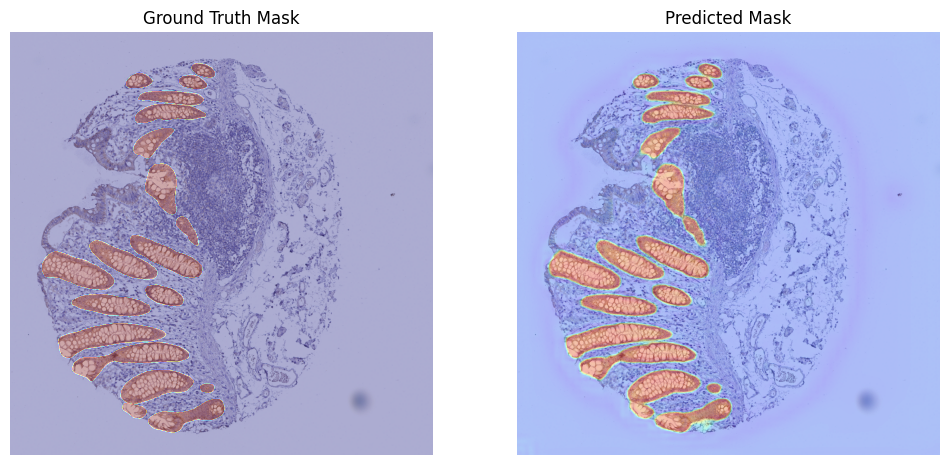

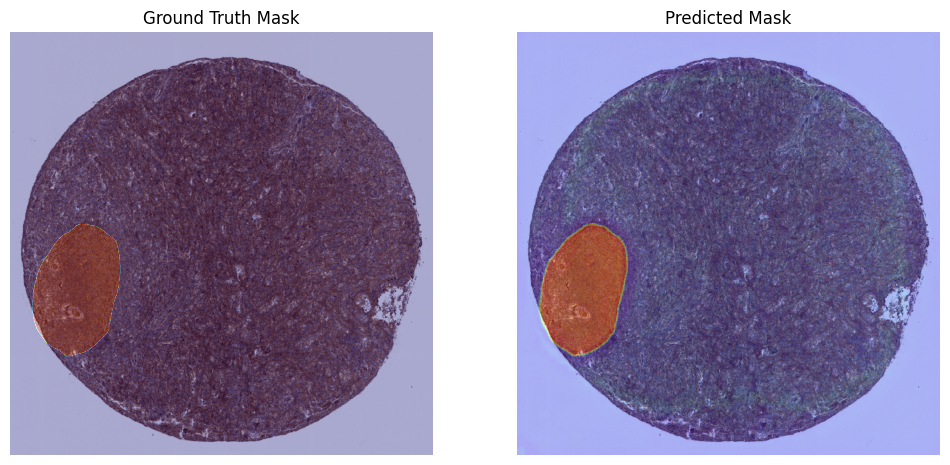

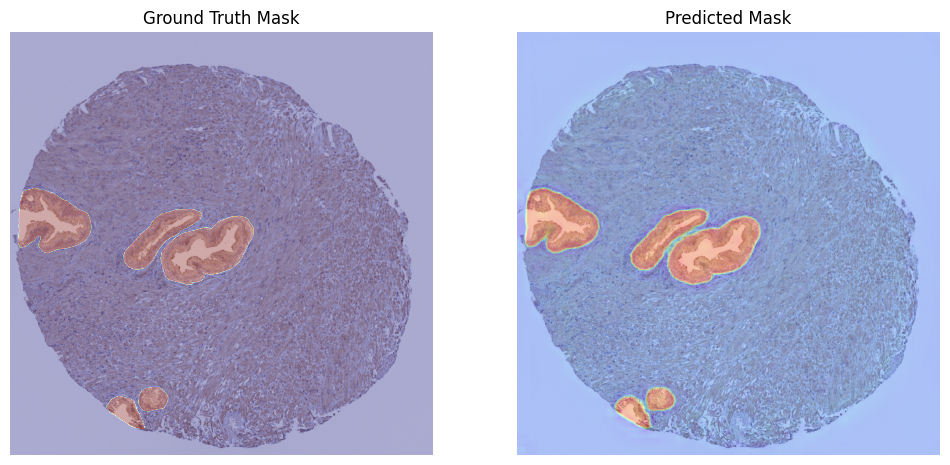

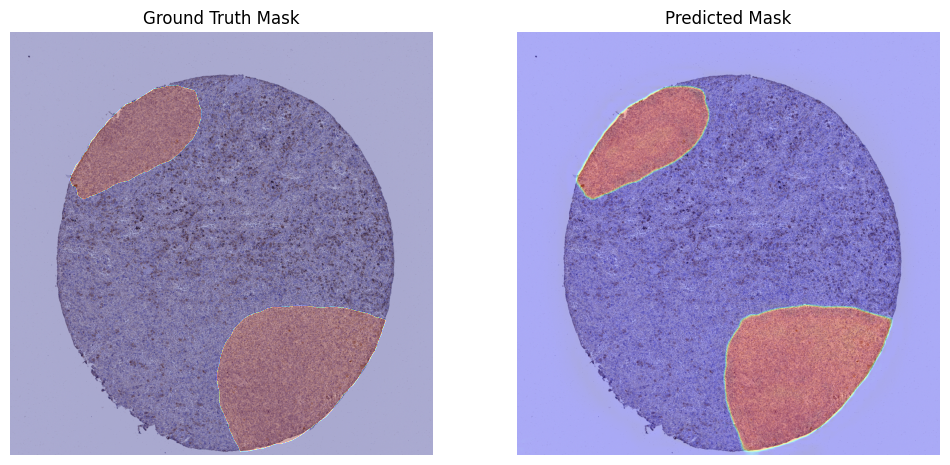

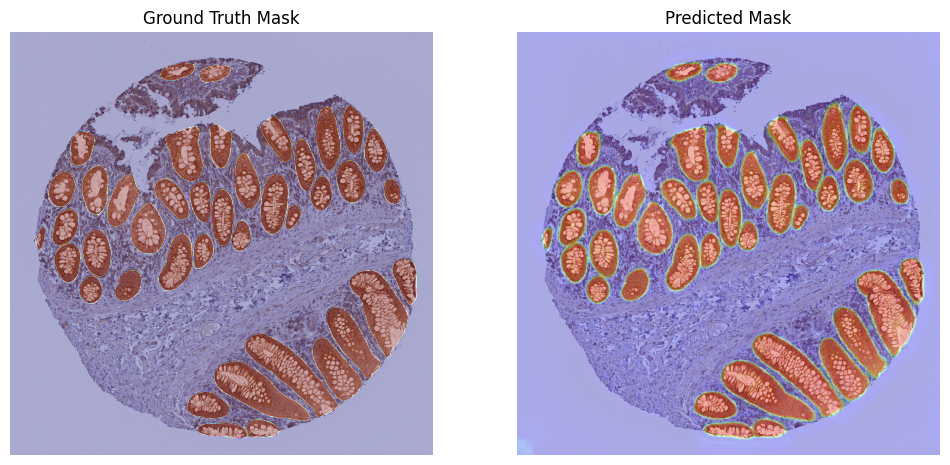

In [45]:
visualize_predictions(model, train_loader)

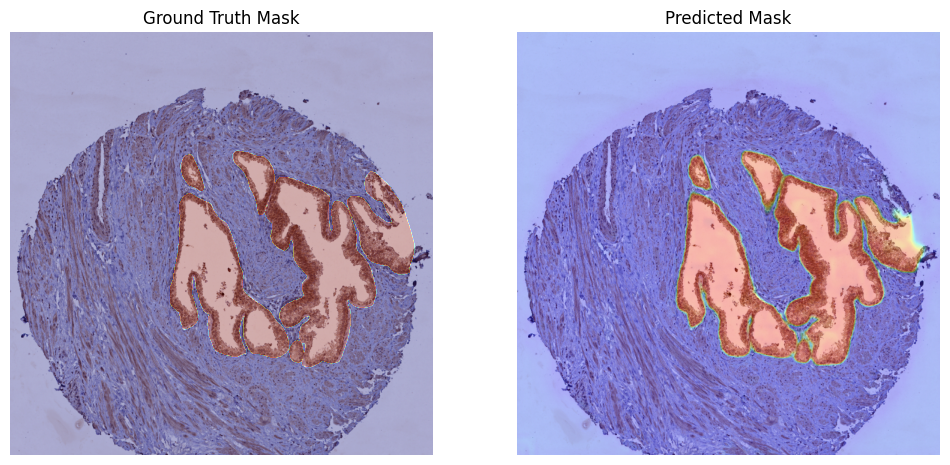

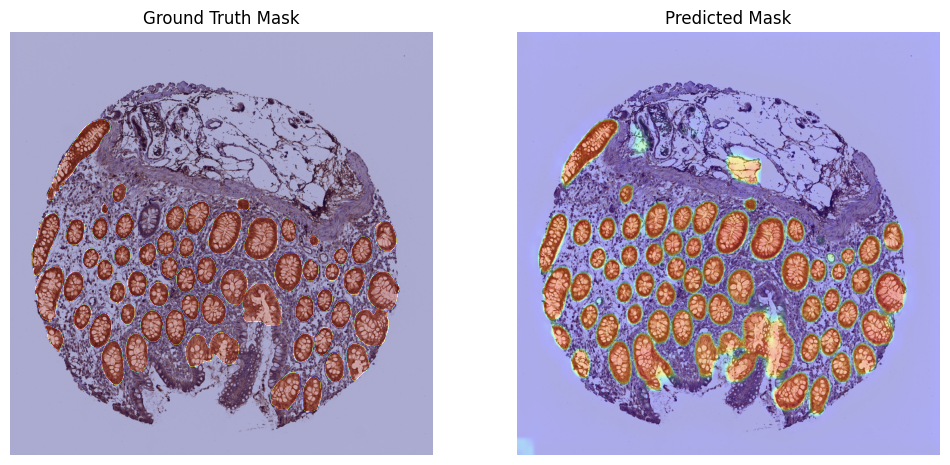

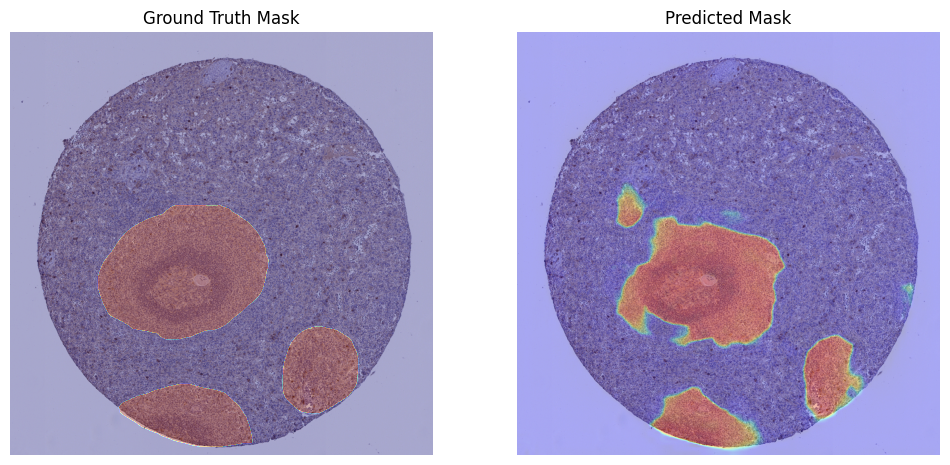

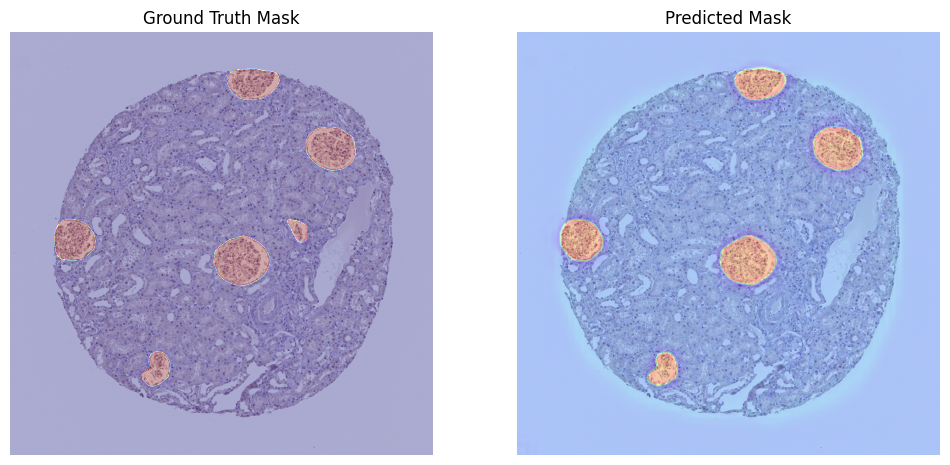

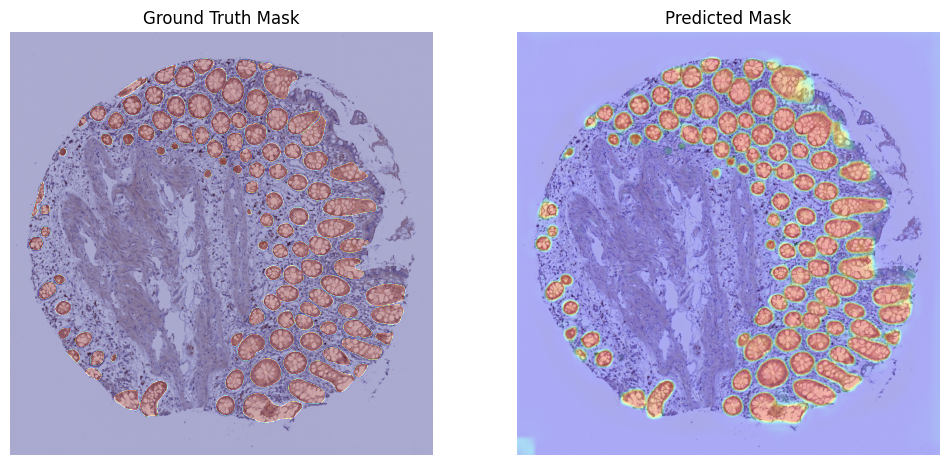

In [46]:
visualize_predictions(model, val_loader)

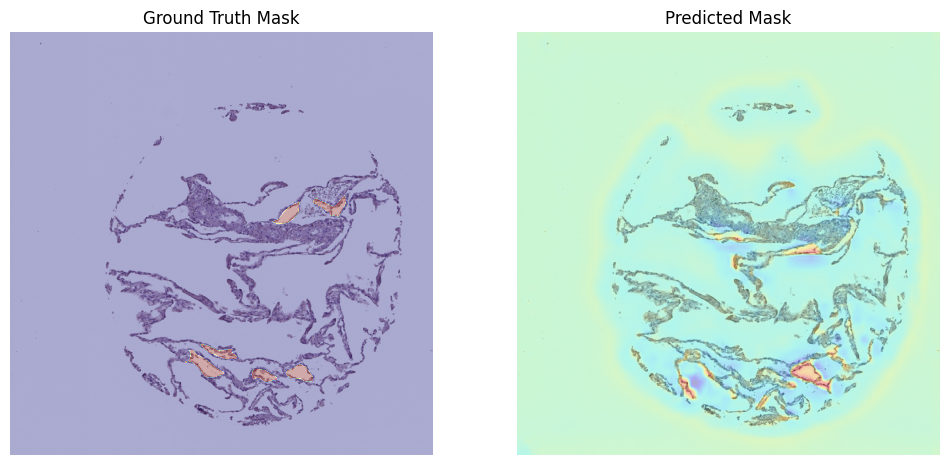

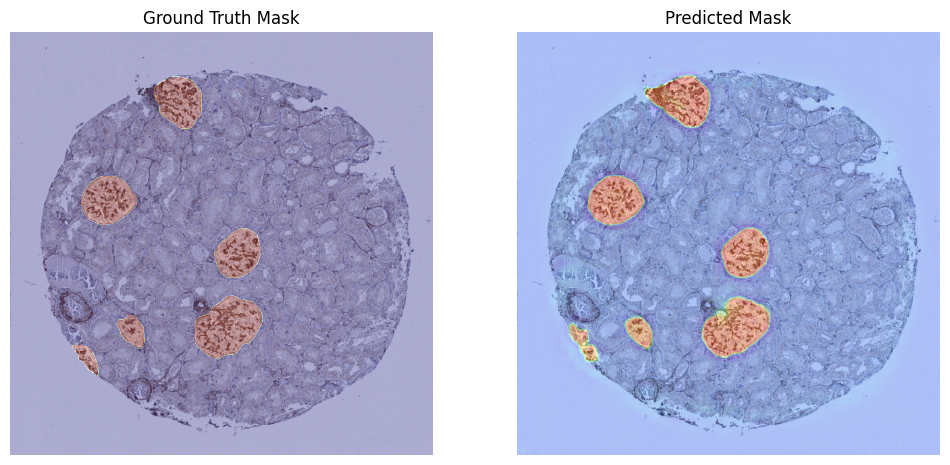

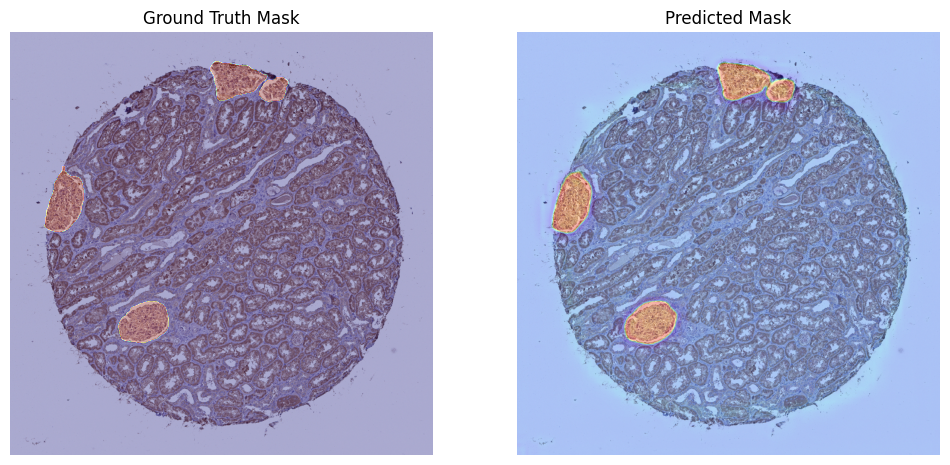

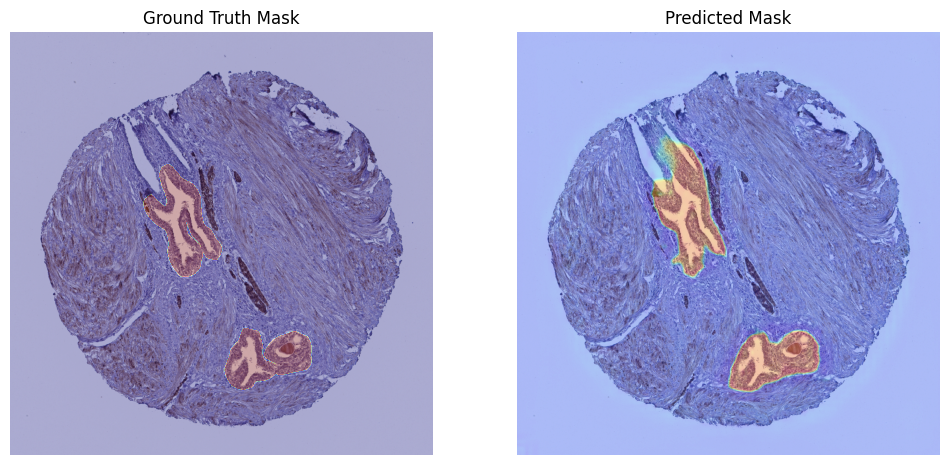

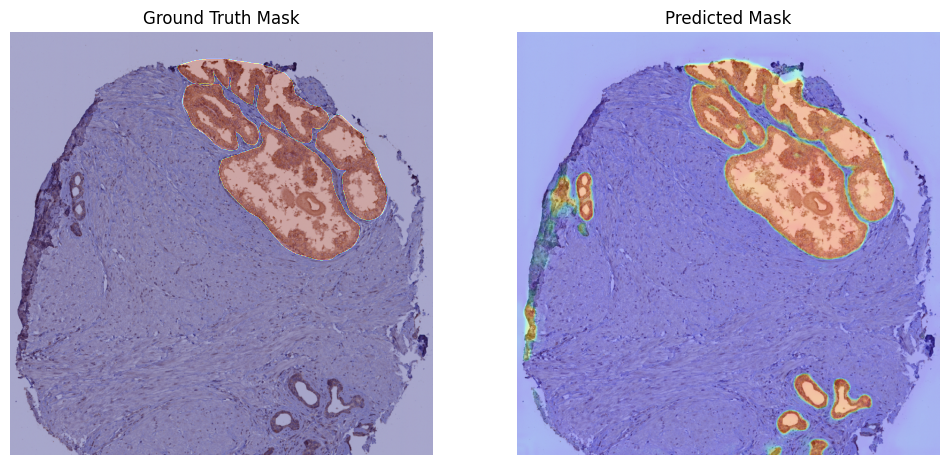

In [47]:
visualize_predictions(model, test_loader)